Author: Shiyue Cao

USCID: 8583755038

Email: shiyuec@usc.edu

# (b) Exploring the data:
## i. How many rows are in this data set? How many columns? What do the rows and columns represent?

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing

data = pd.read_excel(".\\Data\\Folds5x2_pp.xlsx")
f = data.values
print("Rows and columns :")
print(f.shape)
print("Each column represents:")
col = data.columns
print(col)



Rows and columns :
(9568, 5)
Each column represents:
Index(['AT', 'V', 'AP', 'RH', 'PE'], dtype='object')


There are 9568 rows and 5 columns.

Each row is a data point, each column is a feature. The last column is expected to be predict.

Columns include Temperature (T), Ambient Pressure (AP), Relative Humidity (RH), Exhaust Vacuum (V) and energy output (PE).

## (ii) Make pairwise scatterplots of all the varianbles in the data set including the predictors (independent variables) with the dependent variable. Describe your findings.

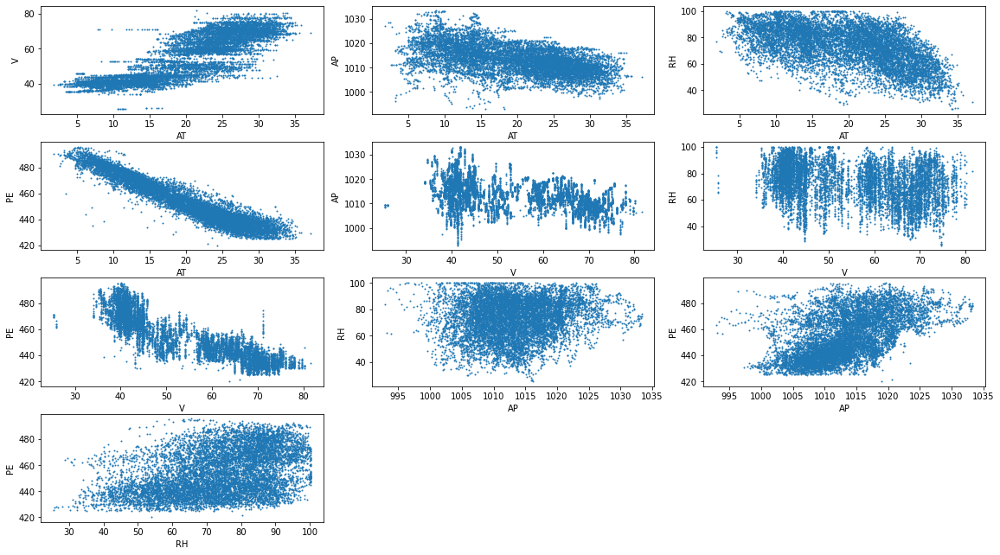

In [10]:
col = data.columns
q = 1
plt.figure(figsize=(16, 9))
for i in range(0, 4):
    for j in range(i+1, 5):
        plt.subplot(4, 3, q)
        plt.xlabel(col[i])
        plt.ylabel(col[j])
        plt.plot(f[:, i], f[:, j], 'o', ms=1)
        q += 1
plt.tight_layout(pad=1, h_pad=0.1)
plt.show()


 From this pairwise scatterplots, I notice that AT and PE may have negative relationship.



## (iii). What are the mean, the median, range, first and third quartiles, and interquartile ranges of each of the variables in the dataset? Summarize them in a table.

In [11]:
table = pd.DataFrame({
    "Mean": data.mean(),
    "Median": data.median(),
    "Range": (data.max()-data.min()),
    "First Quartiles": data.quantile(.25),
    "Third Quartiles": data.quantile(.75),
    "Interquartile Range": data.quantile(.75) - data.quantile(.25)
})
table


,Mean,Median,Range,First Quartiles,Third Quartiles,Interquartile Range
AT,19.651231,20.345,35.30,13.5100,25.72,12.2100
V,54.305804,52.080,56.20,41.7400,66.54,24.8000
AP,1013.259078,1012.940,40.41,1009.1000,1017.26,8.1600
RH,73.308978,74.975,74.60,63.3275,84.83,21.5025
PE,454.365009,451.550,75.50,439.7500,468.43,28.6800


# (c) For each predictor, fit a simple linear regression model to predict the response. Describe your results. In which of the models is there a statistically significant association between the predictor and the response? Create some plots to back up your assertions. Are there any outliers that you would like to remove from your data for each of these regression tasks?

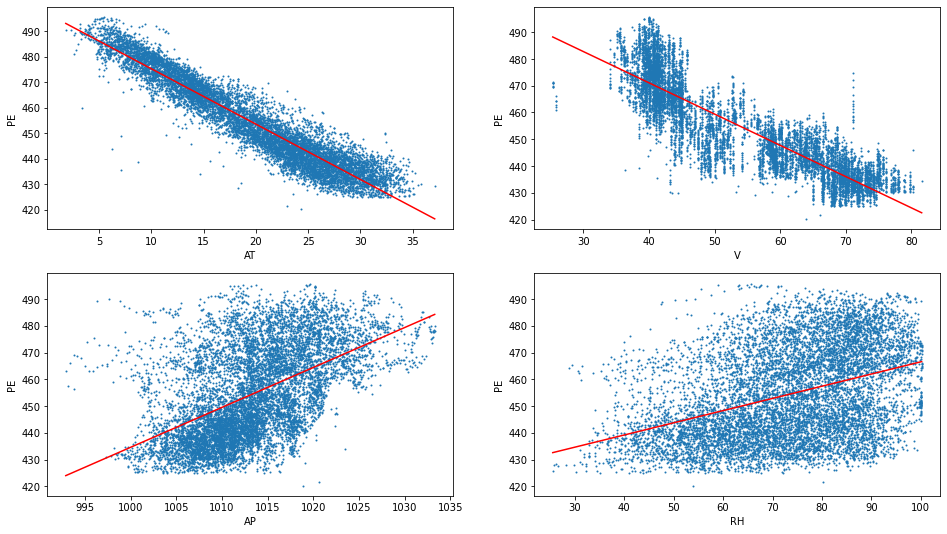

In [12]:

from sklearn.linear_model import LinearRegression


train_target = f[:, -1]

# for (e)
simple_regression = []
q = 1
plt.figure(figsize=(16, 9))
for i in range(0, 4):
    plt.subplot(2, 2, q)
    plt.xlabel(col[i])
    plt.ylabel(col[4])
    plt.plot(f[:, i], f[:, 4], 'o', ms=1)
    q += 1
    train_data = f[:, i].reshape(-1, 1)
    clf = LinearRegression()
    clf.fit(train_data, train_target)
    x = [min(train_data), max(train_data)]
    y = clf.predict(x)
    plt.plot(x, y, 'r-')
    simple_regression.append(clf.coef_[0])

plt.show()



From figure shown above, we can see that AT has strong relation with PE.



 # (d) Fit a multiple regression model to predict the response using all of the predictors. Describe your results. For which predictors can we reject the null hypothesis H0 : βj = 0?

In [13]:
import statsmodels.api as sm
train_data = f[:, :-1]
train_target = f[:, -1]


X2 = sm.add_constant(train_data)
est = sm.OLS(train_target, X2)
clf = est.fit()
table = clf.summary()
print(table)
# for next question
multi_regression = clf.params[1:5]

OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                 3.114e+04
Date:                Thu, 11 Jun 2020   Prob (F-statistic):               0.00
Time:                        23:52:17   Log-Likelihood:                -28088.
No. Observations:                9568   AIC:                         5.619e+04
Df Residuals:                    9563   BIC:                         5.622e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        454.6093      9.749     46.634      0.000     435.500     473.718
x

We don't reject any null hypothesis because all the p-value are close to zero, which means all predictors have significant relation with output.

# (e) How do your results from 1c compare to your results from 1d? Create a plot displaying the univariate regression coefficients from 1c on the x-axis, and the multiple regression coefficients from 1d on the y-axis. That is, each predictor is displayed as a single point in the plot. Its coefficient in a simple linear regression model is shown on the x-axis, and its coefficient estimate in the multiple linear regression model is shown on the y-axis.

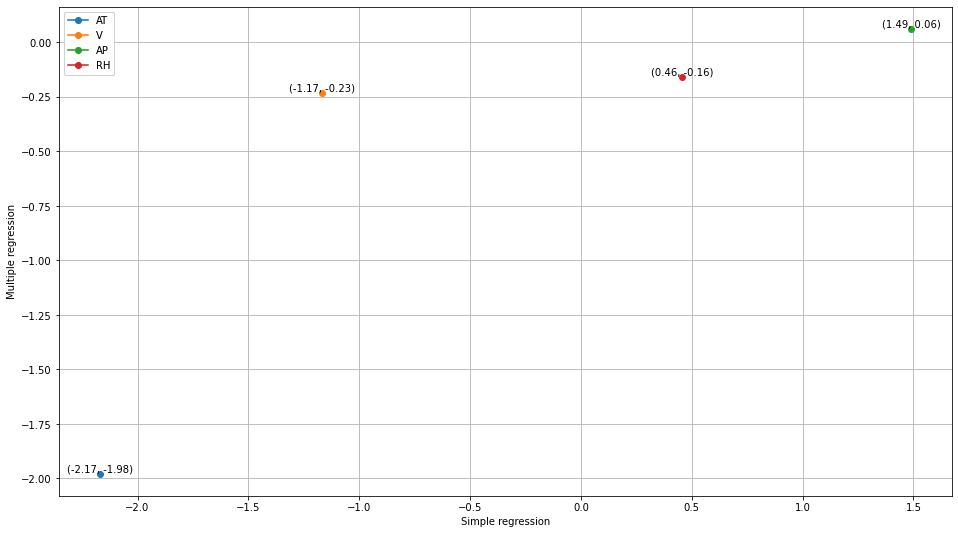

In [14]:
plt.figure(figsize=(16, 9))
for i in range(0, 4):
    plt.plot(simple_regression[i], multi_regression[i],
             marker='o')
    plt.text(simple_regression[i], multi_regression[i], (round(simple_regression[i], 2),
                                                         round(multi_regression[i], 2)), ha='center', va='bottom', fontsize=10)

l = plt.legend(col, loc=2)
plt.gca().add_artist(l)
plt.xlabel("Simple regression")
plt.ylabel("Multiple regression")
plt.grid(True)
plt.show()

# (f) Is there evidence of nonlinear association between any of the predictors and the response? To answer this question, for each predictor X, fit a model of the form

$Y=\beta_0+\beta_1X+\beta_2X^2+\beta_3X^3+\epsilon$

In [15]:
import statsmodels.formula.api as sm
for i in range(0, 4):
    train_data = data[[col[i], col[-1]]]
    clf = sm.ols(formula=col[-1]+'~ ' + col[i] + '+ I('+col[i]+'**2) + I('+col[i]+'**3)',
                 data=train_data).fit()
    table = clf.summary()
    print(table)


OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                 3.299e+04
Date:                Thu, 11 Jun 2020   Prob (F-statistic):               0.00
Time:                        23:52:18   Log-Likelihood:                -29101.
No. Observations:                9568   AIC:                         5.821e+04
Df Residuals:                    9564   BIC:                         5.824e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    492.7281      0.673    732.248      0.000     491.409     494.047
A

By comparing p-value, we can find that AT, AP and RH have non-linear relation with PE. Due to p-value of $V^2$ is large, we can say V doesn't have non-linear relation with PE.


# (g) Is there evidence of association of interactions of predictors with the response? To answer this question, run a full linear regression model with all pairwise interaction terms and state whether any interaction terms are statistically significant

In [16]:
formula = col[-1]+' ~ '
for i in range(0, 4):
    formula += col[i]+'+'
for i in range(0, 3):
    for j in range(i+1, 4):
        formula += 'I(' + col[i]+'*'+col[j] + ')+'
formula = formula[:-1]

clf = sm.ols(formula=formula,
             data=data).fit()
table = clf.summary()
print(table)


OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.936
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                 1.405e+04
Date:                Thu, 11 Jun 2020   Prob (F-statistic):               0.00
Time:                        23:52:18   Log-Likelihood:                -27548.
No. Observations:                9568   AIC:                         5.512e+04
Df Residuals:                    9557   BIC:                         5.520e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    685.7825     78.640      8.721      0.000     531.631     839.934
A

From table above, I find that AT\*V, AT\*RH, V\*AP and AP\*RH have small p-value, which means they are statistically significant.

# (h) Can you improve your model using possible interaction terms or nonlinear associations between the predictors and response? Train the regression model on a randomly selected 70% subset of the data with all predictors. Also, run a regression model involving all possible interaction terms and quadratic nonlinearities, and remove insignificant variables using p-values (be careful about interaction terms). Test both models on the remaining points and report your train and test MSEs

Try all predictors and all quadratic terms to remove some terms with large p-value.

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
import statsmodels.formula.api as sm

data = pd.read_excel(".\\Data\\Folds5x2_pp.xlsx")
f = data.values
train_data = f[:, :-1]
train_target = f[:, -1]

col = data.columns
formula = col[-1]+' ~ '
for i in range(0, 4):
    formula += col[i]+'+'
for i in range(0, 4):
    for j in range(i, 4):
        formula += 'I(' + col[i]+'*'+col[j] + ')+'
formula = formula[:-1]

clf = sm.ols(formula=formula,
             data=data).fit()
table = clf.summary()
print(table)


OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                 1.030e+04
Date:                Thu, 11 Jun 2020   Prob (F-statistic):               0.00
Time:                        23:52:20   Log-Likelihood:                -27431.
No. Observations:                9568   AIC:                         5.489e+04
Df Residuals:                    9553   BIC:                         5.500e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -7503.7323   1207.276     -6.215      0.000   -9870.250   -5137.214
A

Then split the data and train the model, calculate the MSE.

In [18]:
formula = 'PE ~ V+AP+RH+I(AT*AT)+I(AT*V)+I(AT*RH)+I(AP*AP)+I(AP*RH)+I(RH*RH)'

shuffle = np.random.permutation(len(train_data))

test_size = int(len(f) * 0.3)
test_indexes = shuffle[:test_size]
train_indexes = shuffle[test_size:]

test_data = data.iloc[test_indexes]
train_data = data.iloc[train_indexes]

clf = sm.ols(formula=formula,
             data=train_data).fit()

pred_train = clf.predict(train_data.iloc[:, :4])
train_mse = sum((pred_train-train_data.PE).values**2) / \
    len(pred_train)-len(clf.params)

pred_test = clf.predict(test_data.iloc[:, :4])
test_mse = sum((pred_test-test_data.PE).values**2) / \
    len(pred_test)-len(clf.params)
print(train_mse)
print(test_mse)

9.876387135676058
9.267479245344227


# ISLR: 2.4.1


## (a) The sample size n is extremely large, and the number of predictors p is small.

Flexible method is better, because number of samples is much largr than features means flexible method will fit more precisely using great number of samples.


## (b) The number of predictors p is extremely large, and the number of observations n is small.

Flexible method is worse, because flexible method may overfit samples.

## (c) The relationship between the predictors and response is highly non-linear.

Flexible method is better, because inflexible method may underfit with non-linear data.

## (d) The variance of the error terms, i.e. σ^2 = Var(ε), is extremely high.

Flexible method is worse, because flexible method may fit the error and make higher variance.


# ISLR: 2.4.7

## (a)
| Obs.	|  X1|	 X2	|  X3| 	 Y | Distance |
| ------ | --- | --- | ---| ---| --- |
|     1 	| 0 	|3 	| 0 	| Red |$\sqrt 10$ |
|     2 	| 2 	|0 	| 0 	| Red |  $2$ |
|     3 	| 0 	|1 	| 3 	| Red | $\sqrt 10 $ |
|     4 	| 0 	|1 	| 2 	| Green | $\sqrt 5 $ |
|     5 	| -1 |	0 	| 1 	| Green | $\sqrt 2 $ |
|     6 	| 1 	|1 	| 1 	| Red  | $\sqrt 3 $ |

## (b) What is our prediction with K = 1? Why?

Green.For K = 1, the distance of 5-th observation is shortest, 5-th is green.

## (c) What is our prediction with K = 3? Why?

Red, For K = 3, the distance of 5-th, 6-th and 2-nd observation are shortest, two of them are red.

## (d) If the Bayes decision boundary in this problem is highly nonlinear, then would we expect the best value for K to be large or small? Why?

We expect a small k. If k is large, the boundary will become linear.